In [1]:
import numpy as np
import imutils
import time
import cv2

from os import walk

%matplotlib inline
from matplotlib import pyplot as plt

In [2]:
params = {
    'model' : 'enet-cityscapes/enet-model.net',
    'classes': 'enet-cityscapes/enet-classes.txt',
    'colors': 'enet-cityscapes/enet-colors.txt',
    'imagesPath': 'imagesInput'
}
WITDH = 500

In [3]:
CLASSES = open(params["classes"]).read().strip().split("\n")

COLORS = open(params["colors"]).read().strip().split("\n")
COLORS = [np.array(c.split(",")).astype("int") for c in COLORS]
COLORS = np.array(COLORS, dtype="uint8")

In [4]:
# initialize the legend visualization
legend = np.zeros(((len(CLASSES) * 25) + 25, 300, 3), dtype="uint8")

# loop over the class names and colors colors
for (i, (className, color)) in enumerate(zip(CLASSES, COLORS)):
    # draw the class name and thee color on the legend
    color = [int(c) for c in color]
    cv2.putText(legend, className, (5, (i * 25) + 17),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
    cv2.rectangle(legend, (100, (i * 25)), (300, (i * 25) + 25), tuple(color), -1)

In [5]:
# load ENet pretrained model
net = cv2.dnn.readNet(params["model"])
print("ENet model suceffuly loaded.")

files = []
for (dirpath, dirnames, filenames) in walk(params["imagesPath"]):
    files.extend(filenames)
    break

# initialize images list
imagesInput = []
imagesOutput = []
    
for f in files:   
    # load the input image, resize it, and construct a blob
    image = cv2.imread(params["imagesPath"] + '/' + f)
    imagesInput.append(image)
    image = imutils.resize(image, width=WITDH)
    blob = cv2.dnn.blobFromImage(image, 1 / 255.0, (1024, 512), 0, swapRB=True, crop=False)

    # forward into the ENet
    net.setInput(blob)
    start = time.time()
    output = net.forward()
    end = time.time()

    # show the amount of time inference took
    print("ENet output took {:.4f} seconds".format(end - start))
    
    # infer the total number of classes along with the spatial dimensions
    # of the mask image via the shape of the output array
    (numClasses, height, width) = output.shape[1:4]
    
    # get the most probably class
    classMap = np.argmax(output[0], axis=0)

    # map each of the class IDs to its corresponding color
    mask = COLORS[classMap]

    # resize the mask and class map
    mask = cv2.resize(mask, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)
    classMap = cv2.resize(classMap, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # add transparency mask
    output = ((0.4 * image) + (0.6 * mask)).astype("uint8")
    
    imagesOutput.append(output)

ENet model suceffuly loaded.
ENet output took 1.4034 seconds
ENet output took 0.2911 seconds
ENet output took 0.3514 seconds
ENet output took 0.3760 seconds
ENet output took 0.4090 seconds
ENet output took 0.3894 seconds
ENet output took 0.4931 seconds
ENet output took 0.4918 seconds
ENet output took 0.4718 seconds
ENet output took 0.4137 seconds
ENet output took 0.3831 seconds


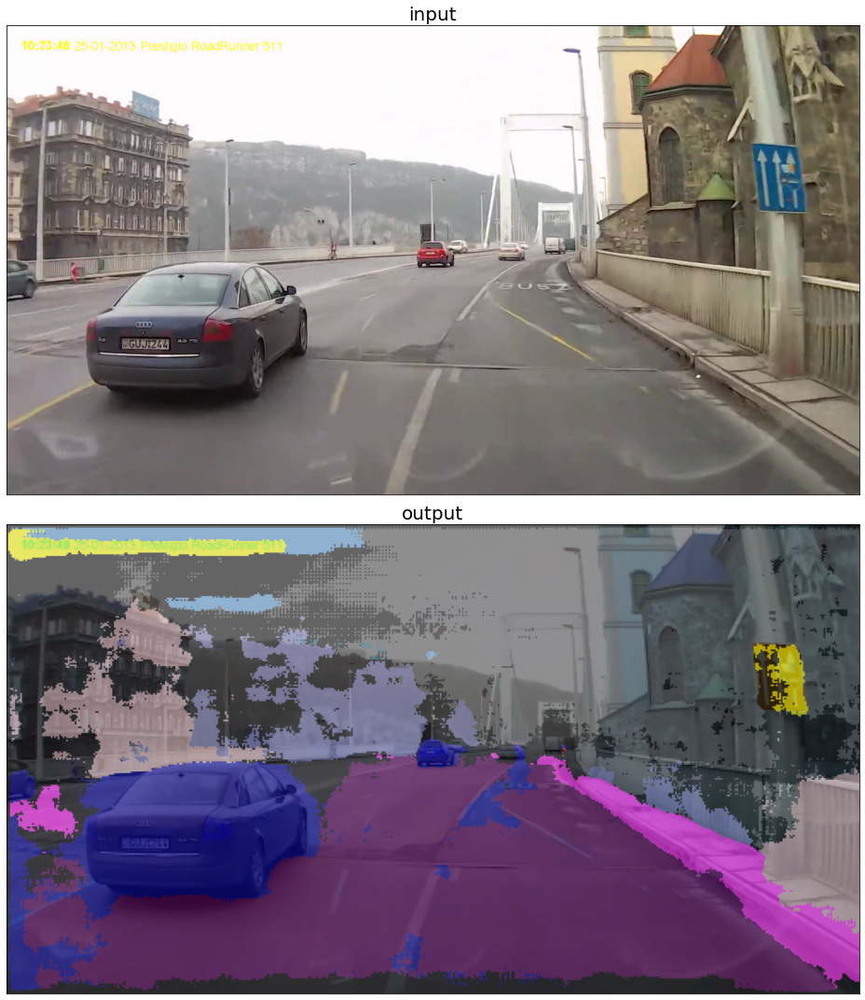

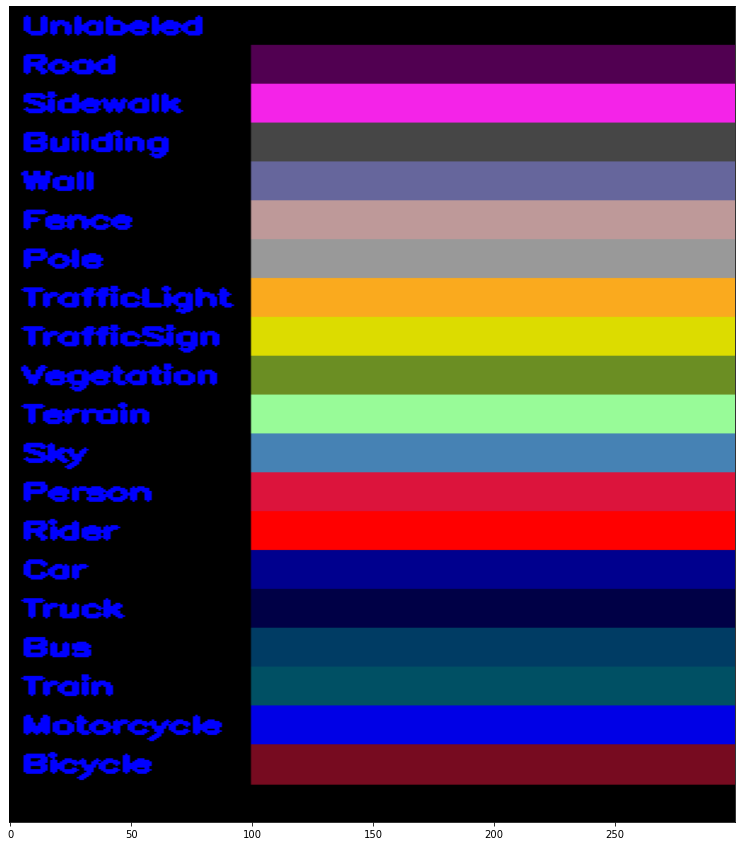

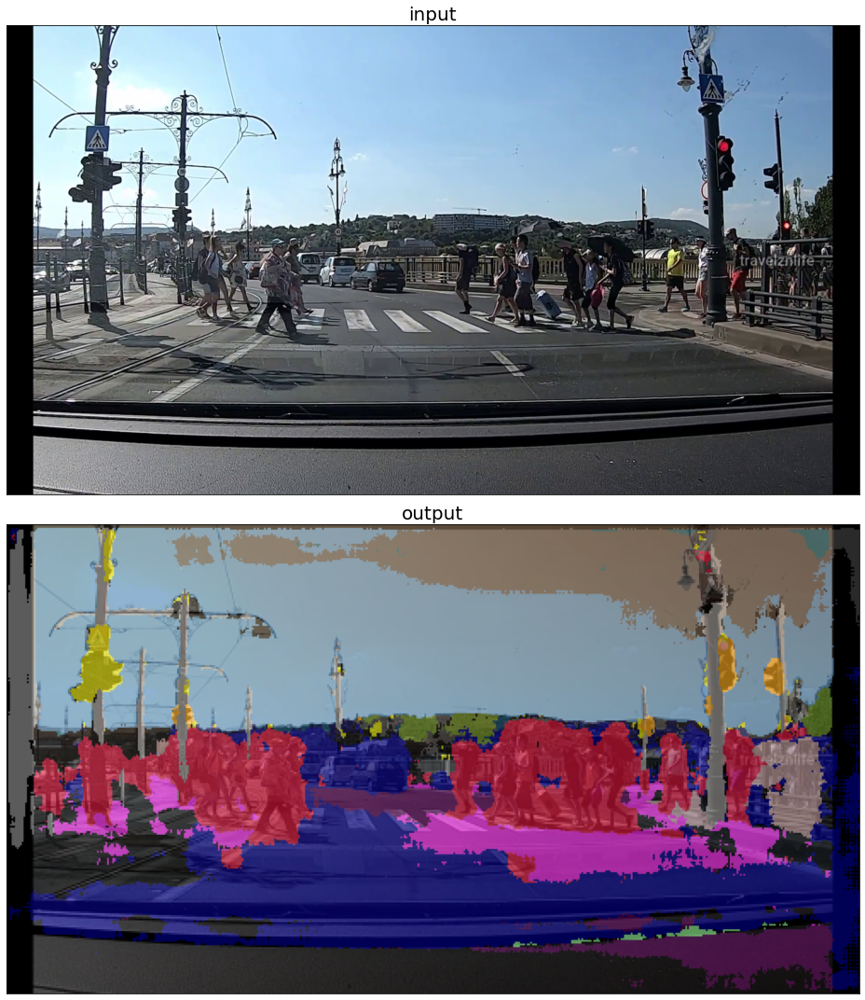

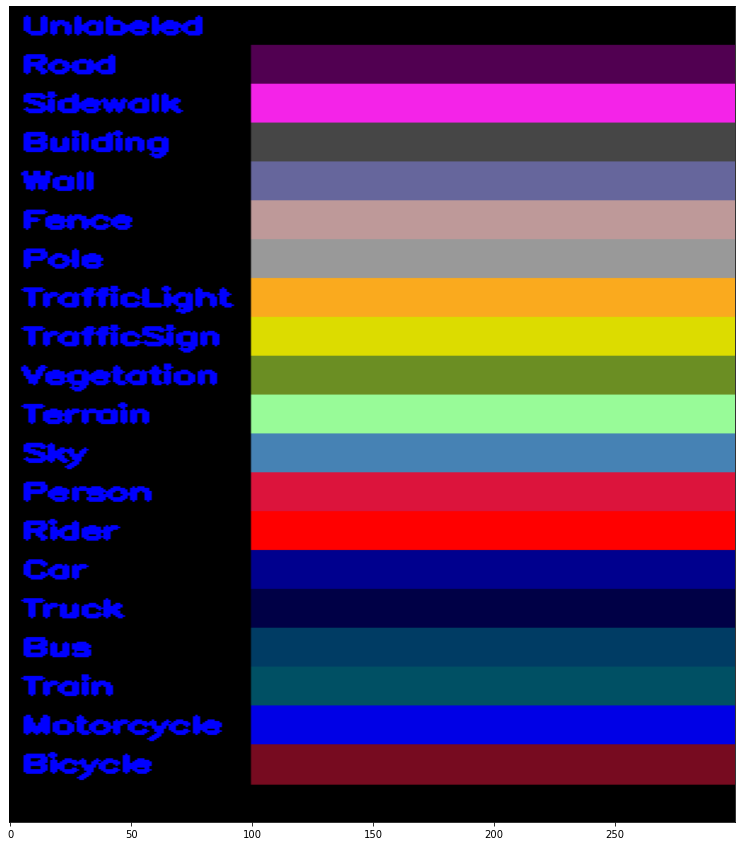

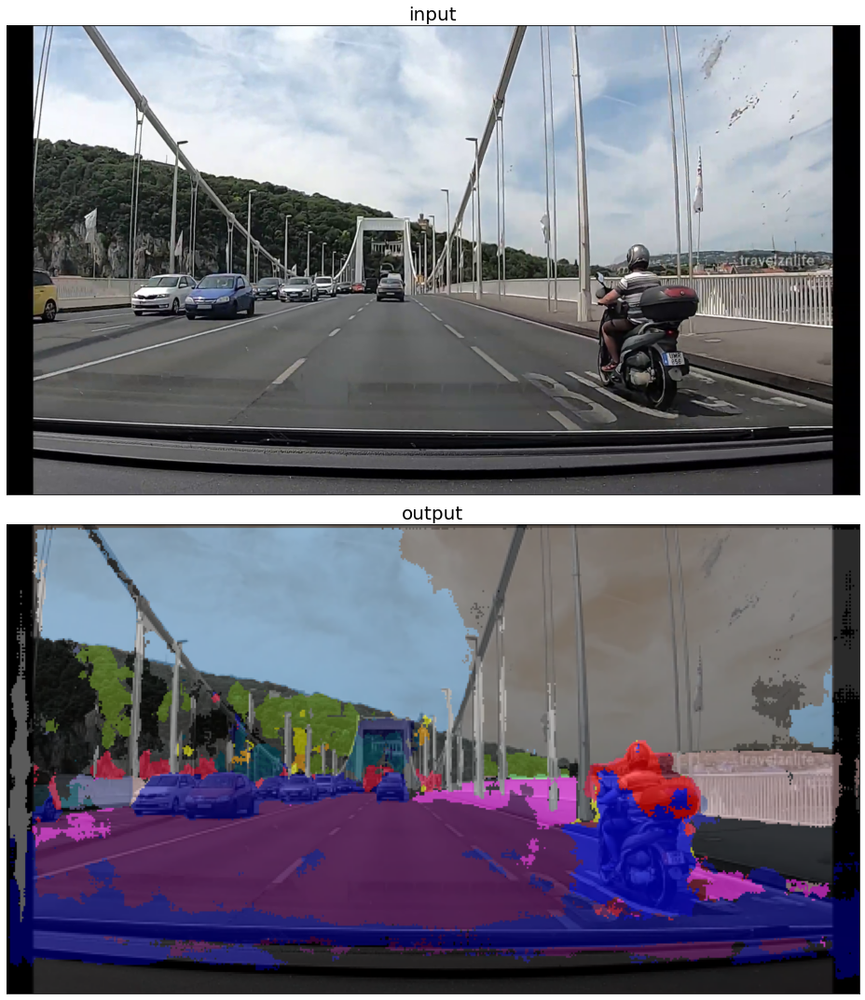

...

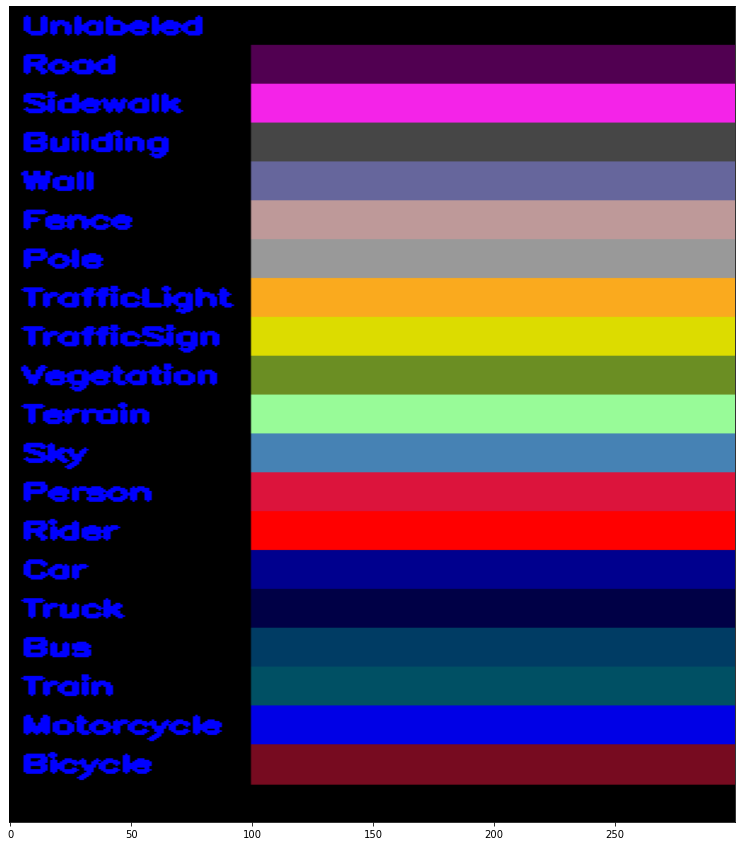

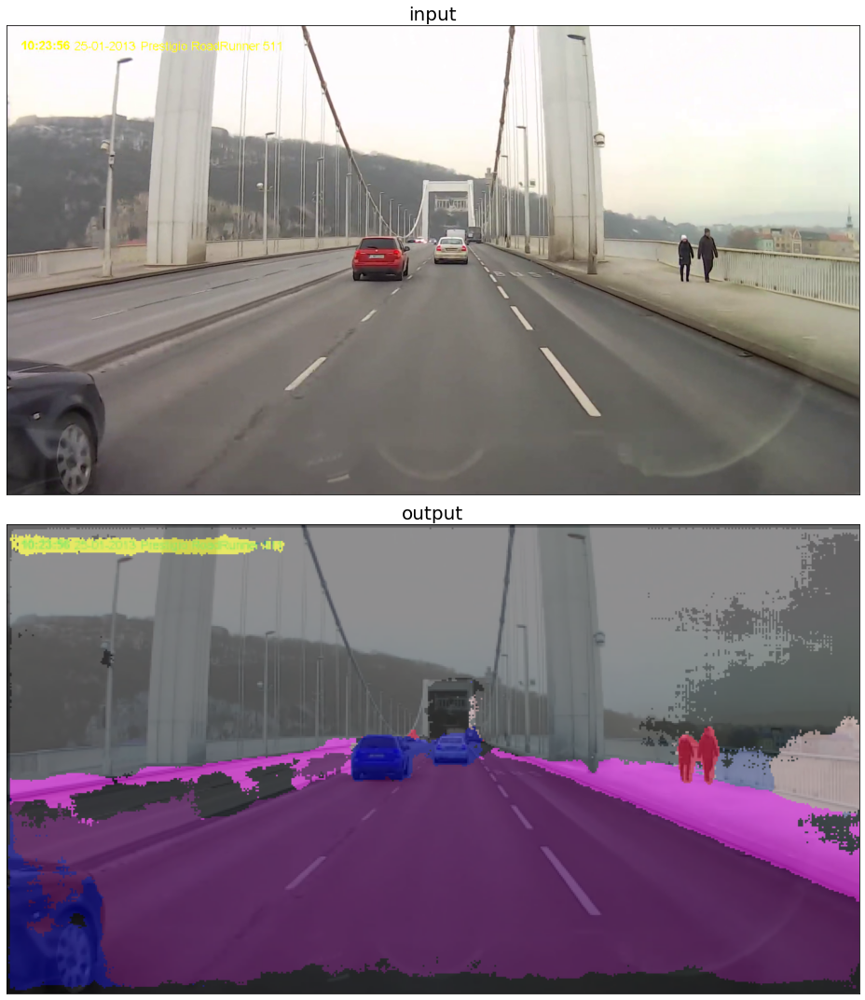

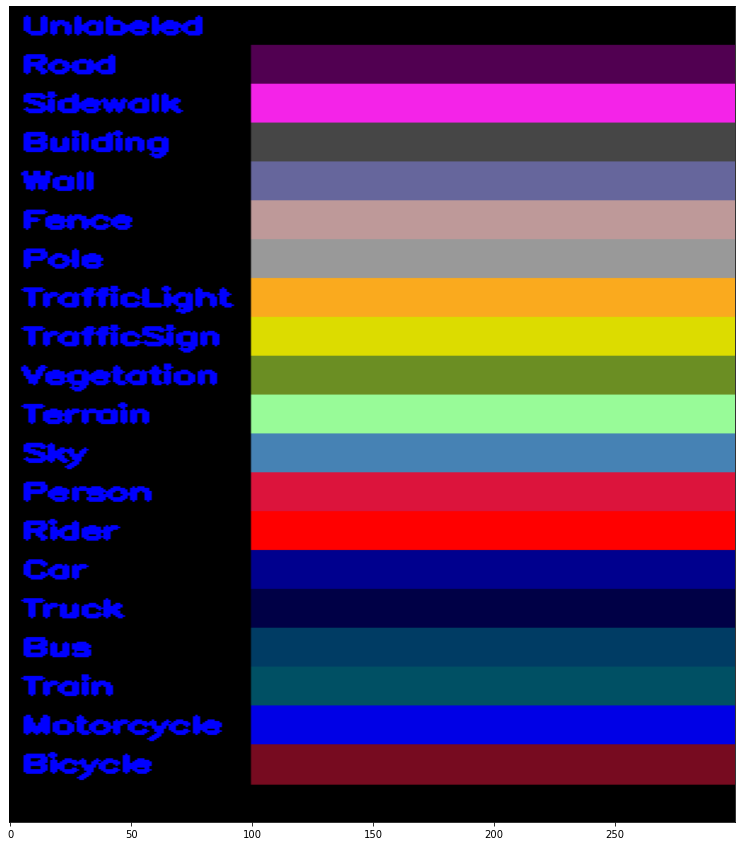

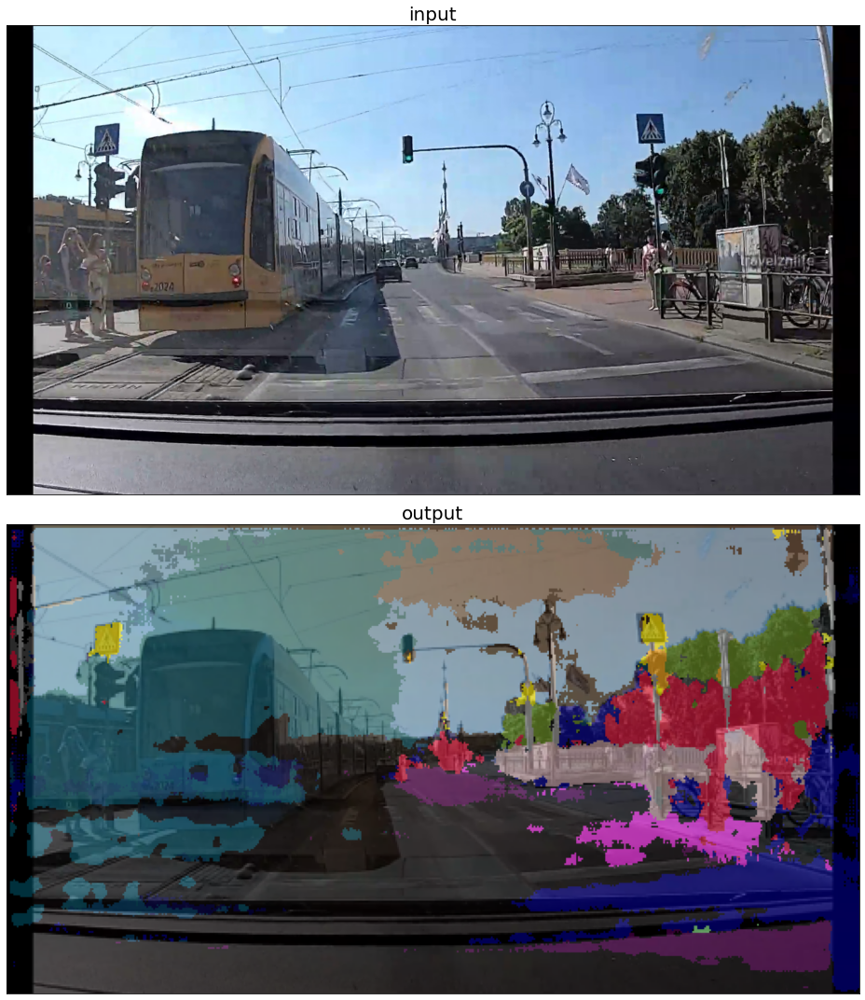

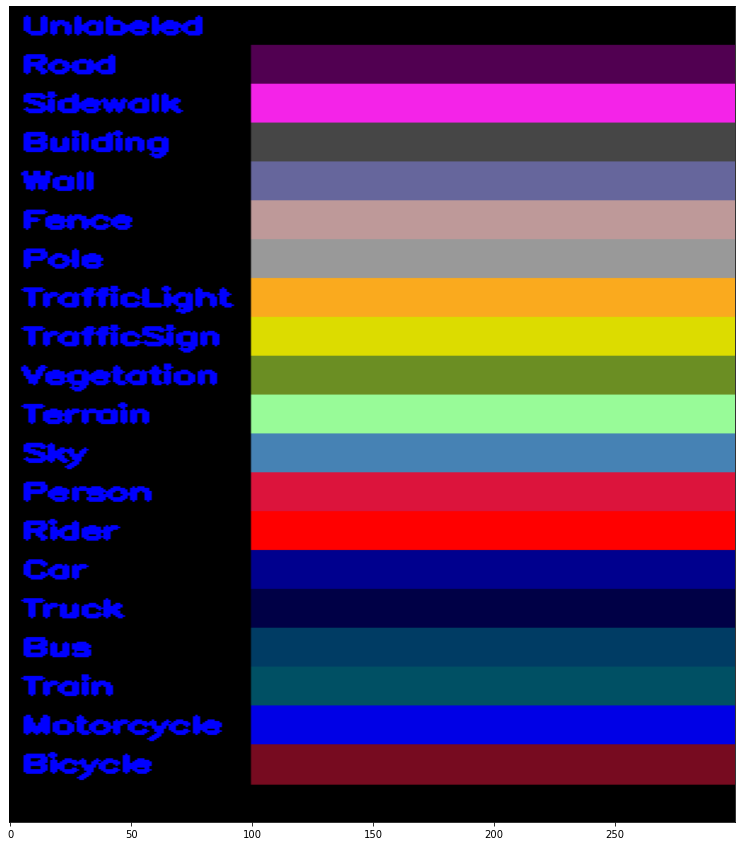

In [6]:
# display input, output and legend
for image, output in zip(imagesInput, imagesOutput):
    fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(13,15))
    # input image
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax1.imshow(img_rgb, aspect='auto')
    ax1.set_title('input',fontsize= 20)
    ax1.set(xticklabels=[])  
    ax1.set(xlabel=None) 
    ax1.set(yticklabels=[])  
    ax1.set(ylabel=None) 
    ax1.tick_params(left=False) 
    ax1.tick_params(bottom=False) 
    # output image
    ax2.imshow(output,aspect='auto')
    ax2.set_title('output',fontsize= 20)
    ax2.set(xticklabels=[])  
    ax2.set(xlabel=None) 
    ax2.set(yticklabels=[])  
    ax2.set(ylabel=None) 
    ax2.tick_params(left=False) 
    ax2.tick_params(bottom=False) 

    plt.tight_layout()
    plt.show()

    # legend
    fig, ax1 = plt.subplots(nrows=1, figsize=(13,15))

    ax1.imshow(legend, aspect='auto')
    ax1.set(yticklabels=[])  
    ax1.set(ylabel=None) 
    ax1.tick_params(left=False) 
    plt.show()